In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="")
project = rf.workspace("urban-lake-wastef").project("extened_dataset-of-waste-classification")
version = project.version(3)
dataset = version.download("coco-segmentation")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 95.8/95.8 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 41.3 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 75.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 116.5 MB/s eta 0:00:0000:01
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.12.0.88
    Uninstalling opencv-python-headless-4.12.0.88:
      Successfully uninstalled opencv-python-headless-4.12.0.88
  Attempting uninstall: idna
    Found existing installation: idna 3.11
    Uninstalling idna-3.11:
      Successfully uninstalled idna-3.11
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-adk 1.21.0 requires google-cloud-bigquery-s


Extracting Dataset Version Zip to Extened_Dataset-of-Waste-Classification-3 in coco-segmentation:: 100%|██████████| 1955/1955 [00:00<00:00, 6039.39it/s]


In [2]:
import json
import os
import pprint

# Resolve dataset root more robustly (works on Kaggle/Colab and if Roboflow download path differs)
if "dataset" in globals() and getattr(dataset, "location", None):
    DATASET_ROOT = dataset.location
else:
    DATASET_ROOT = "/kaggle/working/Another_approach_try-4"
print("Using DATASET_ROOT =", DATASET_ROOT)

# Paths to the annotation files
train_path = os.path.join(DATASET_ROOT, "train", "_annotations.coco.json")
valid_path = os.path.join(DATASET_ROOT, "valid", "_annotations.coco.json")
test_path = os.path.join(DATASET_ROOT, "test", "_annotations.coco.json")

# Load and inspect a sample annotation file to understand its structure
with open(train_path, 'r') as f:
    train_data = json.load(f)

print("Keys in the annotation file:", list(train_data.keys()))
print("\nCategories:")
for cat in train_data['categories']:
    print(f"ID: {cat['id']}, Name: {cat['name']}")

# Check if the dataset has segmentation annotations
has_segmentations = False
for ann in train_data['annotations'][:5]:
    if 'segmentation' in ann and len(ann['segmentation']) > 0:
        has_segmentations = True
        break

if has_segmentations:
    print("\nDataset contains segmentation annotations.")
    print("Sample segmentation annotation:")
    sample_ann = next(ann for ann in train_data['annotations'] if 'segmentation' in ann and len(ann['segmentation']) > 0)
    print(f"  Image ID: {sample_ann['image_id']}")
    print(f"  Category ID: {sample_ann['category_id']}")
    print(f"  Segmentation format: {type(sample_ann['segmentation']).__name__}")
    print(f"  Number of polygons: {len(sample_ann['segmentation'])}")
    if len(sample_ann['segmentation']) > 0:
        print(f"  Points in first polygon: {len(sample_ann['segmentation'][0])//2}")
else:
    print("\nWARNING: Dataset does not contain segmentation annotations!")
    print("This notebook is intended for segmentation data. Sample annotation format:")
    pprint.pprint(train_data['annotations'][0])

Using DATASET_ROOT = /kaggle/working/Extened_Dataset-of-Waste-Classification-3
Keys in the annotation file: ['info', 'licenses', 'categories', 'images', 'annotations']

Categories:
ID: 0, Name: Organic-Paper-Rubber-yUNM-9Y5P-Teq0
ID: 1, Name: Composite_Rubber_Textile
ID: 2, Name: Organic
ID: 3, Name: Paper
ID: 4, Name: Plastic

Dataset contains segmentation annotations.
Sample segmentation annotation:
  Image ID: 0
  Category ID: 1
  Segmentation format: list
  Number of polygons: 1
  Points in first polygon: 18


In [3]:
# ============================================================
# Publication-Quality Plot Settings (A4 Paper Compatible)
# ============================================================
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns

plt.rcParams.update({
    "figure.dpi":         150,
    "savefig.dpi":        600,
    "savefig.bbox":       "tight",
    "savefig.pad_inches": 0.15,
    "pdf.fonttype":       42,
    "ps.fonttype":        42,
    "font.family":        "sans-serif",
    "font.sans-serif":    ["Arial", "DejaVu Sans", "Helvetica"],
    "font.size":          16,
    "axes.titlesize":     22,
    "axes.labelsize":     18,
    "xtick.labelsize":    15,
    "ytick.labelsize":    15,
    "legend.fontsize":    15,
    "figure.titlesize":   24,
    "axes.spines.top":    False,
    "axes.spines.right":  False,
    "axes.grid":          False,
    "axes.linewidth":     1.2,
    "lines.linewidth":    2.0,
})

# Colour-blind-safe palette
CB_PALETTE = ["#E69F00", "#56B4E9", "#009E73", "#F0E442",
              "#0072B2", "#D55E00", "#CC79A7", "#999999"]
sns.set_palette(CB_PALETTE)

print("✅plot settings applied (A4-c 600 DPI).")

✅plot settings applied (A4-c 600 DPI).


# Class Removal and Dataset Analysis

In [4]:
import json
import os

# Class to delete (exact name from Roboflow annotation)
class_to_delete = "Organic-Paper-Rubber-yUNM-9Y5P-Teq0"

def remove_class_from_coco(annotation_path, class_name):
    """
    Remove a specific class from a COCO annotation file
    """
    # Load the annotation file
    with open(annotation_path, 'r') as f:
        data = json.load(f)

    # Find the category ID for the class to delete
    category_id_to_delete = None
    categories_to_keep = []

    for category in data['categories']:
        if category['name'] == class_name:
            category_id_to_delete = category['id']
        else:
            categories_to_keep.append(category)

    if category_id_to_delete is None:
        print(f"Class '{class_name}' not found in {annotation_path}")
        return False

    # Update the categories
    data['categories'] = categories_to_keep

    # Remove annotations for the deleted class
    annotations_to_keep = [
        annotation for annotation in data['annotations']
        if annotation['category_id'] != category_id_to_delete
    ]

    # Count removed annotations
    removed_annotations = len(data['annotations']) - len(annotations_to_keep)

    # Update the annotations
    data['annotations'] = annotations_to_keep

    # Save the updated annotation file
    with open(annotation_path, 'w') as f:
        json.dump(data, f, indent=2)

    print(f"Updated {annotation_path}:")
    print(f"- Removed category '{class_name}' (ID: {category_id_to_delete})")
    print(f"- Removed {removed_annotations} annotations")

    return True

# Process all three dataset splits
for dataset_path in [train_path, valid_path, test_path]:
    if os.path.exists(dataset_path):
        print(f"\nProcessing {dataset_path}...")
        remove_class_from_coco(dataset_path, class_to_delete)
    else:
        print(f"File not found: {dataset_path}")

print("\nClass removal completed!")


Processing /kaggle/working/Extened_Dataset-of-Waste-Classification-3/train/_annotations.coco.json...
Updated /kaggle/working/Extened_Dataset-of-Waste-Classification-3/train/_annotations.coco.json:
- Removed category 'Organic-Paper-Rubber-yUNM-9Y5P-Teq0' (ID: 0)
- Removed 0 annotations

Processing /kaggle/working/Extened_Dataset-of-Waste-Classification-3/valid/_annotations.coco.json...
Updated /kaggle/working/Extened_Dataset-of-Waste-Classification-3/valid/_annotations.coco.json:
- Removed category 'Organic-Paper-Rubber-yUNM-9Y5P-Teq0' (ID: 0)
- Removed 0 annotations

Processing /kaggle/working/Extened_Dataset-of-Waste-Classification-3/test/_annotations.coco.json...
Updated /kaggle/working/Extened_Dataset-of-Waste-Classification-3/test/_annotations.coco.json:
- Removed category 'Organic-Paper-Rubber-yUNM-9Y5P-Teq0' (ID: 0)
- Removed 0 annotations

Class removal completed!


Total number of classes: 4
Class names: Composite_Rubber_Textile, Organic, Paper, Plastic

Image distribution:
- Training set: 1795 images
- Validation set: 103 images
- Test set: 49 images
- Total: 1947 images

Class distribution:


,Class,Training,Validation,Test,Total,Training %,Validation %,Test %,Dataset %
0,Composite_Rubber_Textile,515,31,13,559,92.1,5.5,2.3,14.3
1,Organic,681,39,11,731,93.2,5.3,1.5,18.7
2,Paper,665,46,6,717,92.7,6.4,0.8,18.4
3,Plastic,1698,133,62,1893,89.7,7.0,3.3,48.5




Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



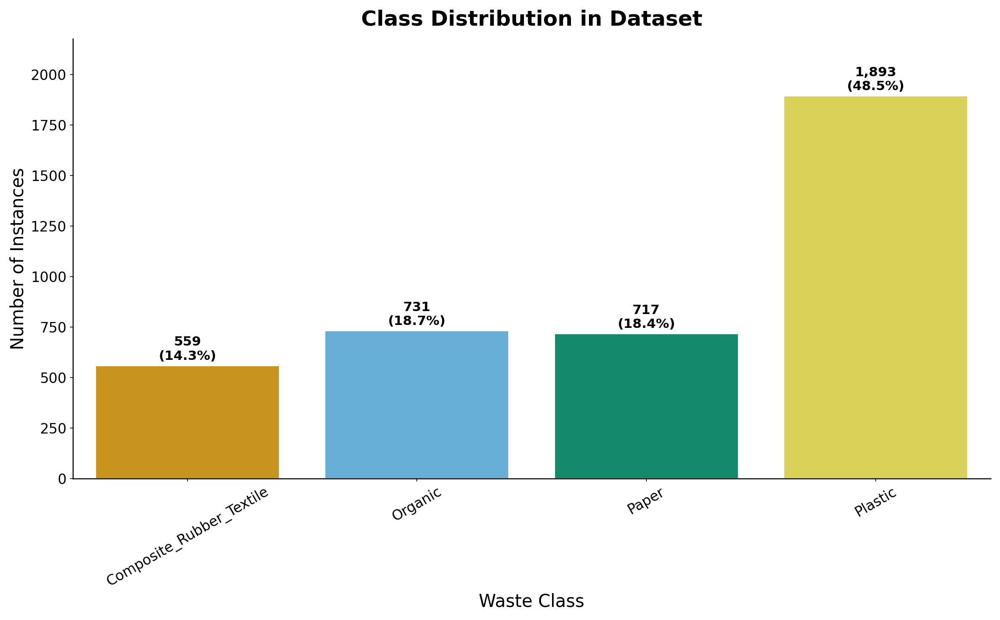

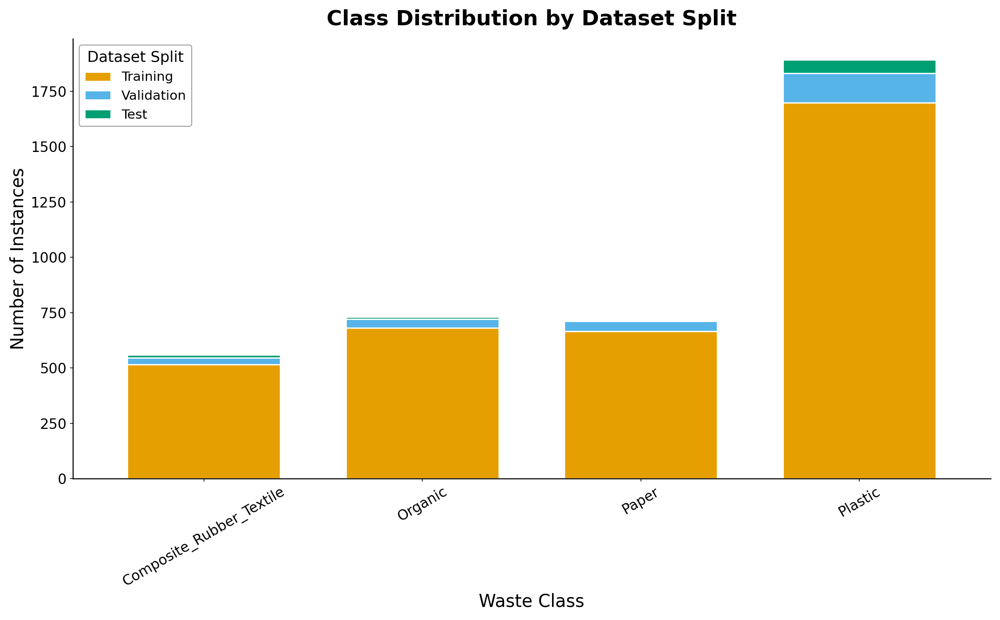


Class Imbalance Analysis:
- Imbalance ratio (most:least): 3.4:1
- Most frequent class: 'Plastic' with 1893 instances (48.5% of dataset)
- Least frequent class: 'Composite_Rubber_Textile' with 559 instances (14.3% of dataset)


In [5]:
import json
import pandas as pd
from collections import Counter
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display

# Load the annotation files
with open(train_path, 'r') as f:
    train_data = json.load(f)

with open(valid_path, 'r') as f:
    valid_data = json.load(f)

with open(test_path, 'r') as f:
    test_data = json.load(f)

# Function to get class details and counts
def analyze_dataset(data):
    # Extract categories
    categories = {cat['id']: cat['name'] for cat in data['categories']}

    # Count instances of each class
    class_counts = Counter()
    for annotation in data['annotations']:
        category_id = annotation['category_id']
        class_counts[categories[category_id]] += 1

    return categories, class_counts, len(data['images'])

# Analyze each dataset
train_categories, train_counts, train_images = analyze_dataset(train_data)
valid_categories, valid_counts, valid_images = analyze_dataset(valid_data)
test_categories, test_counts, test_images = analyze_dataset(test_data)

# Ensure all datasets have the same classes
all_classes = sorted(list(set().union(
    train_categories.values(),
    valid_categories.values(),
    test_categories.values()
)))

# Print general statistics
print(f"Total number of classes: {len(all_classes)}")
print(f"Class names: {', '.join(all_classes)}")
print("\nImage distribution:")
print(f"- Training set: {train_images} images")
print(f"- Validation set: {valid_images} images")
print(f"- Test set: {test_images} images")
print(f"- Total: {train_images + valid_images + test_images} images")

# Create a dataframe for class distribution
data = []
for class_name in all_classes:
    data.append({
        'Class': class_name,
        'Training': train_counts[class_name],
        'Validation': valid_counts[class_name],
        'Test': test_counts[class_name],
        'Total': train_counts[class_name] + valid_counts[class_name] + test_counts[class_name]
    })

df = pd.DataFrame(data)

# Add percentage columns
total_annotations = sum(df['Total'])
df['Training %'] = (df['Training'] / df['Total'] * 100).round(1)
df['Validation %'] = (df['Validation'] / df['Total'] * 100).round(1)
df['Test %'] = (df['Test'] / df['Total'] * 100).round(1)
df['Dataset %'] = (df['Total'] / total_annotations * 100).round(1)

# Display the dataframe
print("\nClass distribution:")
display(df)

# Create visualization of the class distribution
fig, ax = plt.subplots(figsize=(16, 10))
bars = sns.barplot(x='Class', y='Total', data=df, palette=CB_PALETTE[:len(df)], edgecolor='white', ax=ax)
ax.set_title('Class Distribution in Dataset', fontsize=24, fontweight='bold', pad=15)
ax.set_xlabel('Waste Class', fontsize=20)
ax.set_ylabel('Number of Instances', fontsize=20)
ax.tick_params(axis='x', rotation=30, labelsize=16)
ax.tick_params(axis='y', labelsize=16)

# Add total count + percentage on top of each bar
total_annotations = sum(df['Total'])
for i, count in enumerate(df['Total']):
    pct = 100 * count / total_annotations
    ax.text(i, count + df['Total'].max() * 0.015, f"{count:,}\n({pct:.1f}%)",
            ha='center', fontsize=15, fontweight='bold')
ax.set_ylim(0, df['Total'].max() * 1.15)
plt.tight_layout()
plt.show()

# Create stacked bar chart showing split distribution
fig, ax = plt.subplots(figsize=(16, 10))
df_plot = df[['Class', 'Training', 'Validation', 'Test']]
df_plot = df_plot.set_index('Class')
df_plot.plot(kind='bar', stacked=True, ax=ax, color=CB_PALETTE[:3],
             edgecolor='white', width=0.7, linewidth=1.5)
ax.set_title('Class Distribution by Dataset Split', fontsize=24, fontweight='bold', pad=15)
ax.set_xlabel('Waste Class', fontsize=20)
ax.set_ylabel('Number of Instances', fontsize=20)
ax.tick_params(axis='x', rotation=30, labelsize=16)
ax.tick_params(axis='y', labelsize=16)
ax.legend(title='Dataset Split', fontsize=15, title_fontsize=17, frameon=True, edgecolor='gray')
plt.tight_layout()
plt.show()

# Print class imbalance analysis
max_class = df.loc[df['Total'].idxmax()]
min_class = df.loc[df['Total'].idxmin()]


print(f"\nClass Imbalance Analysis:")
print(f"- Imbalance ratio (most:least): {(max_class['Total'] / min_class['Total']).round(1)}:1")
print(f"- Most frequent class: '{max_class['Class']}' with {max_class['Total']} instances ({max_class['Dataset %']}% of dataset)")
print(f"- Least frequent class: '{min_class['Class']}' with {min_class['Total']} instances ({min_class['Dataset %']}% of dataset)")

# Dataset Rebalancing: 70% Training, 20% Validation, 10% Testing

In [6]:
import os
import json
import random
import numpy as np
import shutil
from collections import defaultdict, Counter
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from IPython.display import display
from copy import deepcopy

# Set random seed for reproducibility
random.seed(42)
np.random.seed(42)

# Define dataset paths (prefer Roboflow dataset.location if available)
if "dataset" in globals() and getattr(dataset, "location", None):
    DATASET_ROOT = dataset.location
else:
    DATASET_ROOT = "/kaggle/working/Another_approach_try-4"
print("Using DATASET_ROOT =", DATASET_ROOT)

TRAIN_ANN_FILE = os.path.join(DATASET_ROOT, "train", "_annotations.coco.json")
VAL_ANN_FILE = os.path.join(DATASET_ROOT, "valid", "_annotations.coco.json")
TEST_ANN_FILE = os.path.join(DATASET_ROOT, "test", "_annotations.coco.json")
TRAIN_IMG_DIR = os.path.join(DATASET_ROOT, "train")
VAL_IMG_DIR = os.path.join(DATASET_ROOT, "valid")
TEST_IMG_DIR = os.path.join(DATASET_ROOT, "test")

# Output directories for balanced dataset
BALANCED_ROOT = "/kaggle/working/WasteClassification-Balanced-Segmentation"
BALANCED_TRAIN_DIR = os.path.join(BALANCED_ROOT, "train")
BALANCED_VAL_DIR = os.path.join(BALANCED_ROOT, "valid")
BALANCED_TEST_DIR = os.path.join(BALANCED_ROOT, "test")

# Clean output directory to prevent stale files from previous runs
if os.path.exists(BALANCED_ROOT):
    shutil.rmtree(BALANCED_ROOT)

# Create output directories
os.makedirs(BALANCED_ROOT, exist_ok=True)
os.makedirs(BALANCED_TRAIN_DIR, exist_ok=True)
os.makedirs(BALANCED_VAL_DIR, exist_ok=True)
os.makedirs(BALANCED_TEST_DIR, exist_ok=True)

# Load annotation files
def load_coco_annotations(file_path):
    with open(file_path, 'r') as f:
        return json.load(f)

train_data = load_coco_annotations(TRAIN_ANN_FILE)
val_data = load_coco_annotations(VAL_ANN_FILE)
test_data = load_coco_annotations(TEST_ANN_FILE)

Using DATASET_ROOT = /kaggle/working/Extened_Dataset-of-Waste-Classification-3


In [7]:
# Merge datasets for rebalancing
def merge_datasets(train_data, val_data, test_data):
    """Merge all datasets while preserving source information"""
    merged_data = {
        'images': [],
        'annotations': [],
        'categories': train_data['categories']  # Use categories from training set
    }

    # Track image sources and create new ID mappings
    image_sources = {}  # Maps new image_id to source (train, val, test)
    image_paths = {}    # Maps new image_id to original file path

    # Track the next available IDs
    next_image_id = 1
    next_ann_id = 1

    # Process each dataset
    for dataset_name, dataset, img_dir in [
        ("train", train_data, TRAIN_IMG_DIR),
        ("val", val_data, VAL_IMG_DIR),
        ("test", test_data, TEST_IMG_DIR)
    ]:
        # Map from original image_id to new image_id
        id_map = {}

        # Process images
        for img in dataset['images']:
            old_id = img['id']
            new_id = next_image_id
            next_image_id += 1

            id_map[old_id] = new_id

            # Update image with new ID
            new_img = img.copy()
            new_img["id"] = new_id
            merged_data['images'].append(new_img)

            # Remember source and path
            image_sources[new_id] = dataset_name
            image_paths[new_id] = os.path.join(img_dir, img['file_name'])

        # Process annotations
        for ann in dataset['annotations']:
            old_img_id = ann['image_id']
            new_img_id = id_map.get(old_img_id)

            if new_img_id:
                new_ann = ann.copy()
                new_ann["id"] = next_ann_id
                next_ann_id += 1
                new_ann["image_id"] = new_img_id
                merged_data['annotations'].append(new_ann)

    return merged_data, image_sources, image_paths

# Merge datasets
print("Merging datasets...")
merged_data, image_sources, image_paths = merge_datasets(train_data, val_data, test_data)

print(f"Merged dataset contains {len(merged_data['images'])} images and {len(merged_data['annotations'])} annotations")

Merging datasets...
Merged dataset contains 1947 images and 3900 annotations


In [8]:
# Group annotations by class and image
def group_by_class_and_image(merged_data):
    """Group annotations by class and create image-annotation mapping"""
    # Map from category_id to list of annotation indices
    class_annotations = defaultdict(list)

    # Map from image_id to list of annotation indices
    image_annotations = defaultdict(list)

    # Map from category_id to list of image_ids that contain this category
    class_images = defaultdict(set)

    # Build mappings
    for i, ann in enumerate(merged_data['annotations']):
        cat_id = ann['category_id']
        img_id = ann['image_id']

        class_annotations[cat_id].append(i)
        image_annotations[img_id].append(i)
        class_images[cat_id].add(img_id)

    print("Category distribution in merged dataset:")
    for cat_id, anns in class_annotations.items():
        cat_name = next(cat["name"] for cat in merged_data["categories"] if cat["id"] == cat_id)
        print(f"  {cat_name}: {len(anns)} annotations in {len(class_images[cat_id])} images")

    return class_annotations, image_annotations, class_images

# Group dataset
print("\nAnalyzing merged dataset...")
class_annotations, image_annotations, class_images = group_by_class_and_image(merged_data)


Analyzing merged dataset...
Category distribution in merged dataset:
  Composite_Rubber_Textile: 559 annotations in 450 images
  Plastic: 1893 annotations in 1128 images
  Paper: 717 annotations in 497 images
  Organic: 731 annotations in 543 images


In [9]:
# ── Image-level stratified split (fixes data leakage & keeps ALL data) ──
from sklearn.model_selection import StratifiedShuffleSplit
from collections import Counter

def dominant_class(img_id, merged_data):
    """Return the most-frequent category_id among annotations for *img_id*."""
    cats = [a['category_id'] for a in merged_data['annotations'] if a['image_id'] == img_id]
    if not cats:
        return -1
    return Counter(cats).most_common(1)[0][0]

def stratified_image_split(merged_data, image_paths, val_frac=0.20, test_frac=0.10, seed=42):
    """
    Split at the IMAGE level using the dominant class as the stratification key.
    Returns three COCO dicts + the image-ID sets for each split.
    """
    all_img_ids = np.array([img['id'] for img in merged_data['images']])
    labels = np.array([dominant_class(i, merged_data) for i in all_img_ids])

    # First split: separate test set
    sss1 = StratifiedShuffleSplit(n_splits=1, test_size=test_frac, random_state=seed)
    trainval_idx, test_idx = next(sss1.split(all_img_ids, labels))

    # Second split: separate val from trainval
    val_frac_adj = val_frac / (1 - test_frac)       # adjust fraction for the remaining data
    sss2 = StratifiedShuffleSplit(n_splits=1, test_size=val_frac_adj, random_state=seed)
    train_idx, val_idx = next(sss2.split(all_img_ids[trainval_idx], labels[trainval_idx]))

    train_img_ids = set(all_img_ids[trainval_idx[train_idx]])
    val_img_ids   = set(all_img_ids[trainval_idx[val_idx]])
    test_img_ids  = set(all_img_ids[test_idx])

    # Zero-overlap sanity checks
    assert train_img_ids.isdisjoint(val_img_ids),  "Train/Val overlap!"
    assert train_img_ids.isdisjoint(test_img_ids), "Train/Test overlap!"
    assert val_img_ids.isdisjoint(test_img_ids),   "Val/Test overlap!"

    categories = deepcopy(merged_data['categories'])

    def _build_coco(img_id_set):
        imgs = [img for img in merged_data['images'] if img['id'] in img_id_set]
        anns = [ann for ann in merged_data['annotations'] if ann['image_id'] in img_id_set]
        return {"images": imgs, "annotations": anns, "categories": categories}

    train_data = _build_coco(train_img_ids)
    val_data   = _build_coco(val_img_ids)
    test_data  = _build_coco(test_img_ids)

    print(f"Train : {len(train_data['images']):>4d} images, {len(train_data['annotations']):>5d} annotations")
    print(f"Val   : {len(val_data['images']):>4d} images, {len(val_data['annotations']):>5d} annotations")
    print(f"Test  : {len(test_data['images']):>4d} images, {len(test_data['annotations']):>5d} annotations")
    print(f"Total : {len(train_data['images'])+len(val_data['images'])+len(test_data['images'])} images  "
          f"(no data discarded)")

    return train_data, val_data, test_data, train_img_ids, val_img_ids, test_img_ids

# Run the image-level stratified split
print("\nCreating image-level stratified split (no data leakage, no data loss)...")
balanced_train, balanced_val, balanced_test, train_img_set, val_img_set, test_img_set = \
    stratified_image_split(merged_data, image_paths)


Creating image-level stratified split (no data leakage, no data loss)...
Train : 1362 images,  2736 annotations
Val   :  390 images,   747 annotations
Test  :  195 images,   417 annotations
Total : 1947 images  (no data discarded)


In [10]:
# Save the split datasets (image-set based — no annotation-level leakage)
def _ensure_coco_header(data: dict):
    if "info" not in data or not isinstance(data.get("info"), dict):
        data["info"] = {"description": "Generated by notebook", "version": "1.0"}
    if "licenses" not in data or not isinstance(data.get("licenses"), list):
        data["licenses"] = []
    return data

def save_coco_dataset(data, output_dir, image_id_set, image_paths):
    """Save COCO dataset and copy the corresponding images."""
    os.makedirs(output_dir, exist_ok=True)
    data = _ensure_coco_header(data)

    # Save annotation file
    ann_path = os.path.join(output_dir, "_annotations.coco.json")
    with open(ann_path, 'w') as f:
        json.dump(data, f, indent=2)

    # Copy images
    print(f"Copying {len(image_id_set)} images to {output_dir}...")
    for img_id in tqdm(image_id_set, desc="Copying images"):
        src_path = image_paths[img_id]
        img_info = next(img for img in data['images'] if img['id'] == img_id)
        dest_path = os.path.join(output_dir, img_info['file_name'])
        shutil.copy2(src_path, dest_path)

    print(f"Saved dataset to {output_dir}")

# Save the datasets
print("\nSaving stratified datasets...")
save_coco_dataset(balanced_train, BALANCED_TRAIN_DIR, train_img_set, image_paths)
save_coco_dataset(balanced_val, BALANCED_VAL_DIR, val_img_set, image_paths)
save_coco_dataset(balanced_test, BALANCED_TEST_DIR, test_img_set, image_paths)


Saving stratified datasets...
Copying 1362 images to /kaggle/working/WasteClassification-Balanced-Segmentation/train...


Copying images: 100%|██████████| 1362/1362 [00:00<00:00, 4606.19it/s]


Saved dataset to /kaggle/working/WasteClassification-Balanced-Segmentation/train
Copying 390 images to /kaggle/working/WasteClassification-Balanced-Segmentation/valid...


Copying images: 100%|██████████| 390/390 [00:00<00:00, 6378.65it/s]


Saved dataset to /kaggle/working/WasteClassification-Balanced-Segmentation/valid
Copying 195 images to /kaggle/working/WasteClassification-Balanced-Segmentation/test...


Copying images: 100%|██████████| 195/195 [00:00<00:00, 6736.87it/s]

Saved dataset to /kaggle/working/WasteClassification-Balanced-Segmentation/test



Analyzing balanced dataset...

Balanced Dataset Summary:
- Total classes: 4
- Training: 1362 images, 2736 annotations
- Validation: 390 images, 747 annotations
- Test: 195 images, 417 annotations

Class distribution in balanced dataset:


,Class,Training,Validation,Test,Total,Training %,Validation %,Test %,Dataset %
0,Composite_Rubber_Textile,393,109,57,559,70.3,19.5,10.2,14.3
1,Organic,509,144,78,731,69.6,19.7,10.7,18.7
2,Paper,502,131,84,717,70.0,18.3,11.7,18.4
3,Plastic,1332,363,198,1893,70.4,19.2,10.5,48.5




Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



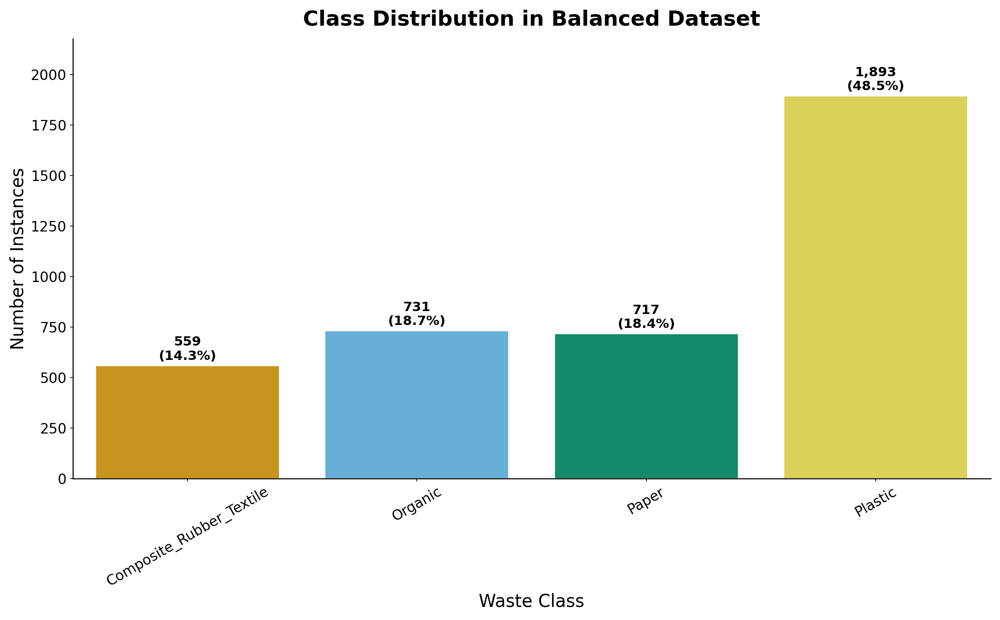

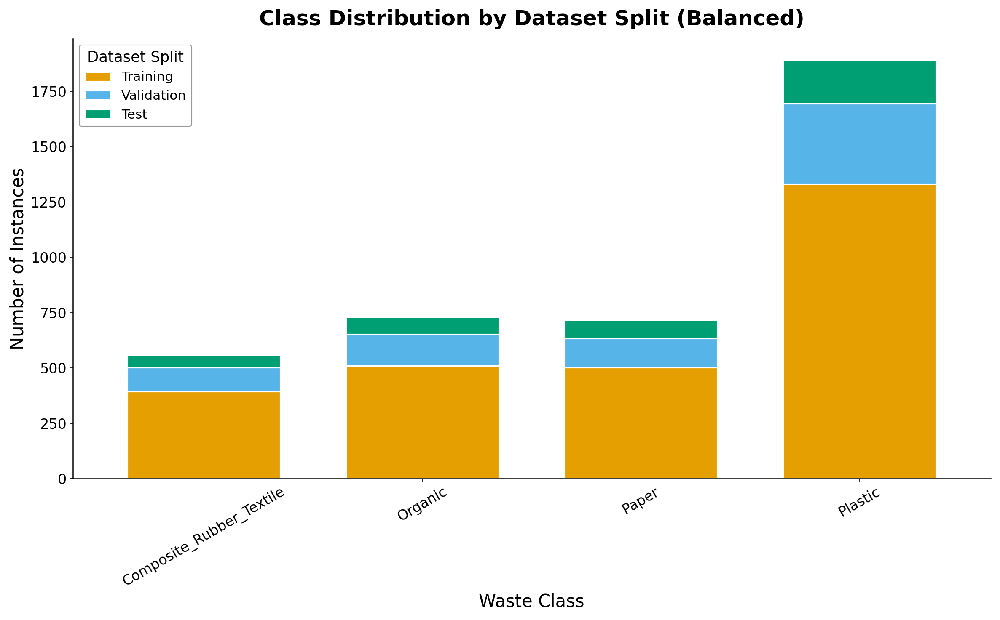


Class Balance Analysis:
- Most frequent class: 'Plastic' with 1893 instances (48.5% of dataset)
- Least frequent class: 'Composite_Rubber_Textile' with 559 instances (14.3% of dataset)
- Balance ratio (most:least): 3.39:1


In [11]:
# Analyze the balanced datasets
def analyze_balanced_dataset():
    """Analyze class distribution in the balanced datasets"""
    # Load the balanced dataset annotations
    balanced_train_path = os.path.join(BALANCED_TRAIN_DIR, "_annotations.coco.json")
    balanced_val_path = os.path.join(BALANCED_VAL_DIR, "_annotations.coco.json")
    balanced_test_path = os.path.join(BALANCED_TEST_DIR, "_annotations.coco.json")

    with open(balanced_train_path, 'r') as f:
        balanced_train_data = json.load(f)

    with open(balanced_val_path, 'r') as f:
        balanced_val_data = json.load(f)

    with open(balanced_test_path, 'r') as f:
        balanced_test_data = json.load(f)

    # Analyze class distribution
    train_categories, train_counts, train_images = analyze_dataset(balanced_train_data)
    val_categories, val_counts, val_images = analyze_dataset(balanced_val_data)
    test_categories, test_counts, test_images = analyze_dataset(balanced_test_data)

    # Create dataframe for visualization
    all_classes = sorted(list(set().union(
        train_categories.values(),
        val_categories.values(),
        test_categories.values()
    )))

    data = []
    for class_name in all_classes:
        data.append({
            'Class': class_name,
            'Training': train_counts[class_name],
            'Validation': val_counts[class_name],
            'Test': test_counts[class_name],
            'Total': train_counts[class_name] + val_counts[class_name] + test_counts[class_name]
        })

    df = pd.DataFrame(data)

    # Add percentage columns
    total_annotations = sum(df['Total'])
    df['Training %'] = (df['Training'] / df['Total'] * 100).round(1)
    df['Validation %'] = (df['Validation'] / df['Total'] * 100).round(1)
    df['Test %'] = (df['Test'] / df['Total'] * 100).round(1)
    df['Dataset %'] = (df['Total'] / total_annotations * 100).round(1)

    # Print summary
    print(f"\nBalanced Dataset Summary:")
    print(f"- Total classes: {len(all_classes)}")
    print(f"- Training: {train_images} images, {sum(train_counts.values())} annotations")
    print(f"- Validation: {val_images} images, {sum(val_counts.values())} annotations")
    print(f"- Test: {test_images} images, {sum(test_counts.values())} annotations")

    # Display class distribution
    print("\nClass distribution in balanced dataset:")
    display(df)

    # Create visualization
    fig, ax = plt.subplots(figsize=(16, 10))
    sns.barplot(x='Class', y='Total', data=df, palette=CB_PALETTE[:len(df)], edgecolor='white', ax=ax)
    ax.set_title('Class Distribution in Balanced Dataset', fontsize=24, fontweight='bold', pad=15)
    ax.set_xlabel('Waste Class', fontsize=20)
    ax.set_ylabel('Number of Instances', fontsize=20)
    ax.tick_params(axis='x', rotation=30, labelsize=16)
    ax.tick_params(axis='y', labelsize=16)

    # Add total count + percentage on top of each bar
    total_ann = sum(df['Total'])
    for i, count in enumerate(df['Total']):
        pct = 100 * count / total_ann
        ax.text(i, count + df['Total'].max() * 0.015, f"{count:,}\n({pct:.1f}%)",
                ha='center', fontsize=15, fontweight='bold')
    ax.set_ylim(0, df['Total'].max() * 1.15)
    plt.tight_layout()
    plt.show()

    # Create stacked bar chart
    fig, ax = plt.subplots(figsize=(16, 10))
    df_plot = df[['Class', 'Training', 'Validation', 'Test']]
    df_plot = df_plot.set_index('Class')
    df_plot.plot(kind='bar', stacked=True, ax=ax, color=CB_PALETTE[:3],
                 edgecolor='white', width=0.7, linewidth=1.5)
    ax.set_title('Class Distribution by Dataset Split (Balanced)', fontsize=24, fontweight='bold', pad=15)
    ax.set_xlabel('Waste Class', fontsize=20)
    ax.set_ylabel('Number of Instances', fontsize=20)
    ax.tick_params(axis='x', rotation=30, labelsize=16)
    ax.tick_params(axis='y', labelsize=16)
    ax.legend(title='Dataset Split', fontsize=15, title_fontsize=17, frameon=True, edgecolor='gray')
    plt.tight_layout()
    plt.show()

    # Class imbalance analysis
    max_class = df.loc[df['Total'].idxmax()]
    min_class = df.loc[df['Total'].idxmin()]

    print(f"\nClass Balance Analysis:")
    print(f"- Most frequent class: '{max_class['Class']}' with {max_class['Total']} instances ({max_class['Dataset %']}% of dataset)")
    print(f"- Least frequent class: '{min_class['Class']}' with {min_class['Total']} instances ({min_class['Dataset %']}% of dataset)")
    print(f"- Balance ratio (most:least): {(max_class['Total'] / min_class['Total']).round(2)}:1")

# Analyze balanced dataset
print("\nAnalyzing balanced dataset...")
analyze_balanced_dataset()

# Segmentation Visualization

Visualizing sample segmentations from balanced training set:


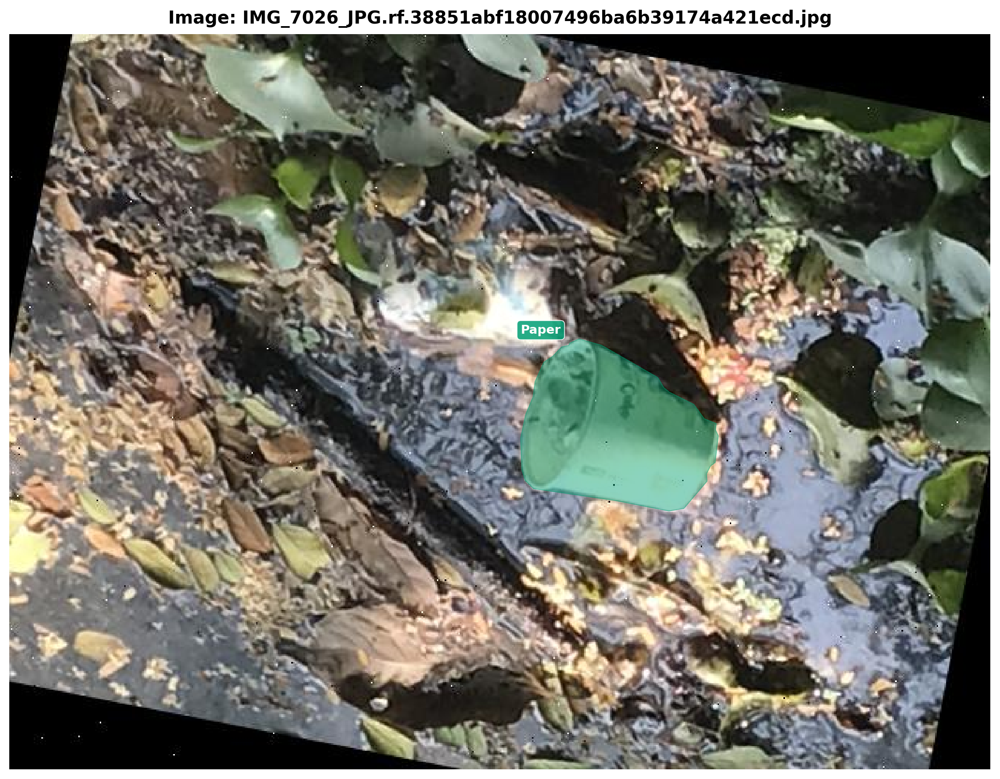

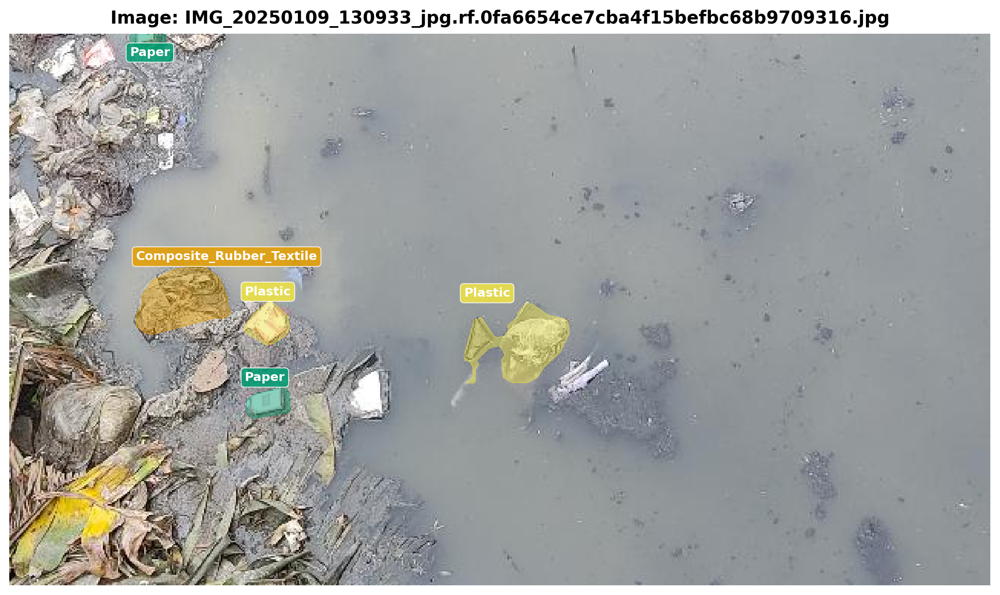

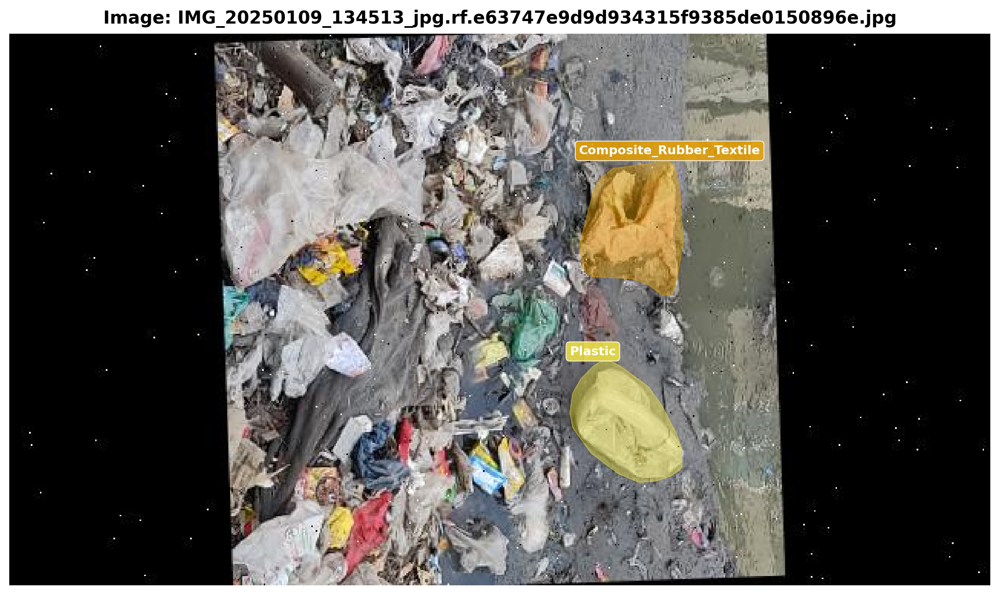


Visualizing sample segmentations from balanced validation set:


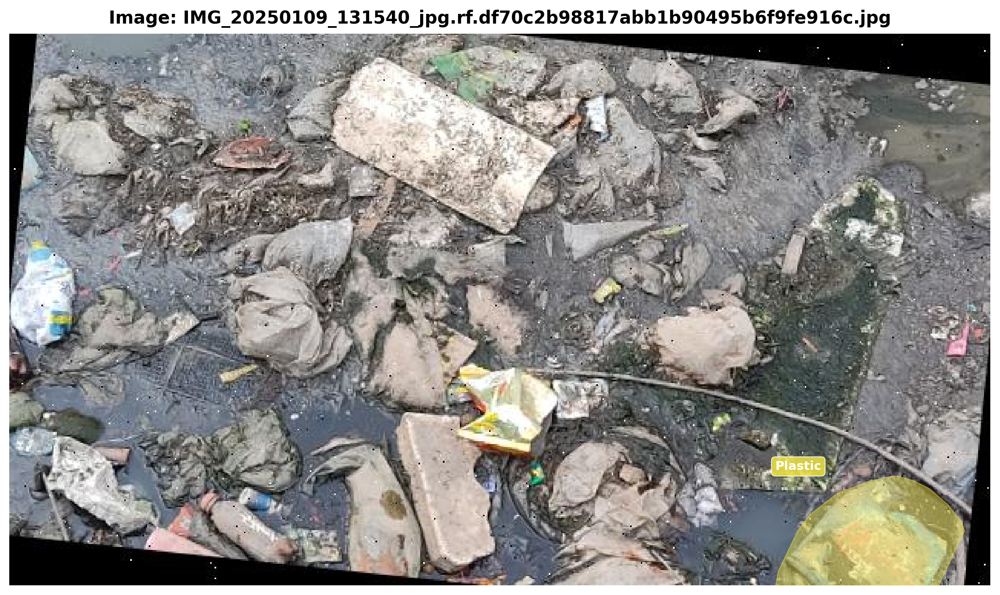

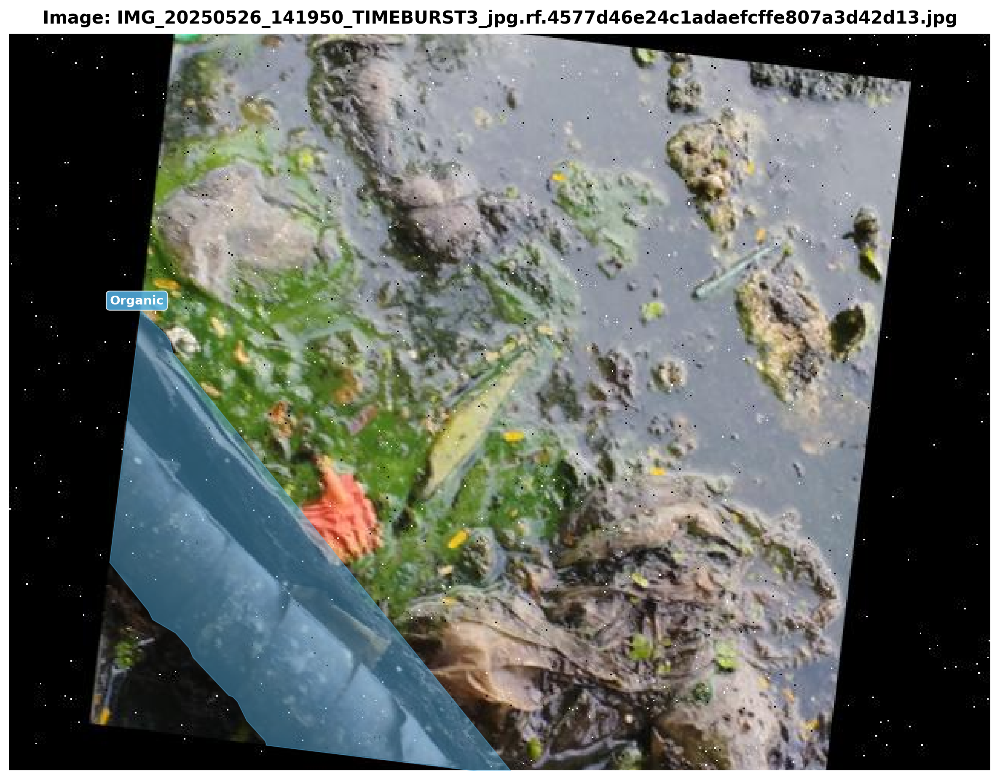


Visualizing sample segmentations from balanced test set:


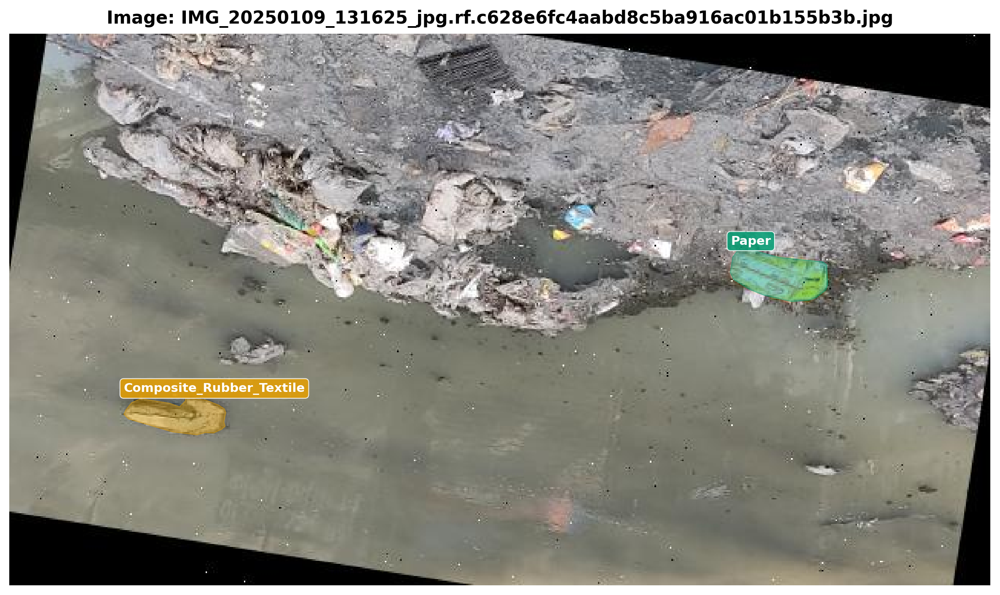

In [12]:
# Visualize segmentation masks for sample images
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection

def visualize_segmentations(dataset_path, num_samples=3):
    """Visualize segmentation masks for random samples"""
    # Load annotations
    annotation_file = os.path.join(dataset_path, "_annotations.coco.json")
    if not os.path.exists(annotation_file):
        print(f"Annotation file not found: {annotation_file}")
        return
    with open(annotation_file, 'r') as f:
        data = json.load(f)

    # Create category id to name mapping
    categories = {cat['id']: cat['name'] for cat in data['categories']}

    # Create image id to annotations mapping
    image_to_anns = defaultdict(list)
    for ann in data['annotations']:
        image_to_anns[ann['image_id']].append(ann)

    # Select random images that have segmentations
    images_with_segmentations = []
    for img in data['images']:
        anns = image_to_anns[img['id']]
        if any('segmentation' in ann and len(ann['segmentation']) > 0 for ann in anns):
            images_with_segmentations.append(img)

    if not images_with_segmentations:
        print("No images with segmentations found in the dataset.")
        return

    # Select random samples
    samples = random.sample(images_with_segmentations, min(num_samples, len(images_with_segmentations)))

    # Visualize each sample
    for img_info in samples:
        img_path = os.path.join(dataset_path, img_info['file_name'])
        img = cv2.imread(img_path)
        if img is None:
            print(f"Warning: could not read image: {img_path}")
            continue
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Get annotations for this image
        anns = image_to_anns[img_info['id']]

        # Setup figure — large, A4-compatible
        fig, ax = plt.subplots(1, figsize=(16, 14))
        ax.imshow(img)
        ax.set_title(f"Image: {img_info['file_name']}", fontsize=20, fontweight='bold', pad=12)

        # Distinct colours per class (colour-blind-safe)
        _cb = ["#E69F00", "#56B4E9", "#009E73", "#F0E442",
               "#0072B2", "#D55E00", "#CC79A7", "#999999"]
        colors_map = {cid: _cb[i % len(_cb)] for i, cid in enumerate(categories.keys())}

        # Draw segmentations
        for ann in anns:
            if 'segmentation' in ann and len(ann['segmentation']) > 0:
                hex_c = colors_map.get(ann['category_id'], '#FFFFFF').lstrip('#')
                rgba = tuple(int(hex_c[k:k+2], 16)/255 for k in (0, 2, 4)) + (0.45,)
                for seg in ann['segmentation']:
                    poly = np.array(seg).reshape(-1, 2)
                    polygon = Polygon(poly, closed=True, alpha=0.45, color=rgba[:3])
                    ax.add_patch(polygon)

                category = categories[ann['category_id']]
                x, y = ann['bbox'][0], ann['bbox'][1]
                ax.text(x, max(y - 4, 14), category, color='white', fontsize=14, fontweight='bold',
                       bbox={'facecolor': rgba[:3], 'alpha': 0.85, 'edgecolor': 'white',
                             'boxstyle': 'round,pad=0.3'})

        ax.axis('off')
        plt.tight_layout()
        plt.show()

# Visualize segmentations from the balanced dataset
print("Visualizing sample segmentations from balanced training set:")
visualize_segmentations(BALANCED_TRAIN_DIR, num_samples=3)

print("\nVisualizing sample segmentations from balanced validation set:")
visualize_segmentations(BALANCED_VAL_DIR, num_samples=2)

print("\nVisualizing sample segmentations from balanced test set:")
visualize_segmentations(BALANCED_TEST_DIR, num_samples=1)

# Dataset Export and Summary

**Training Code:**

In [13]:
%pip install -q torch torchvision
%pip install -q -U git+https://github.com/facebookresearch/detectron2.git
%pip install -q transformers albumentations opencv-python scikit-learn
%pip install -q pycocotools
%pip install -q opencv-python-headless

Note: you may need to restart the kernel to use updated packages.
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 2.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 7.5 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [14]:
%pip install -q opencv-python matplotlib

Note: you may need to restart the kernel to use updated packages.


In [15]:
import os
import cv2
import argparse
import random
import torch
from detectron2 import model_zoo
from detectron2.config import get_cfg
from detectron2.engine import DefaultTrainer, DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data.datasets import register_coco_instances
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.utils.logger import setup_logger
from detectron2.utils.visualizer import Visualizer, ColorMode
import matplotlib.pyplot as plt
setup_logger()


<Logger detectron2 (DEBUG)>


Checking /kaggle/working/WasteClassification-Balanced-Segmentation/train/_annotations.coco.json:
- Images: 1362
- Annotations: 2736
- Added segmentation to 0 annotations
- Saved to /kaggle/working/WasteClassification-Balanced-Segmentation/train/_annotations_with_seg.coco.json

Checking /kaggle/working/WasteClassification-Balanced-Segmentation/valid/_annotations.coco.json:
- Images: 390
- Annotations: 747
- Added segmentation to 0 annotations
- Saved to /kaggle/working/WasteClassification-Balanced-Segmentation/valid/_annotations_with_seg.coco.json

Checking /kaggle/working/WasteClassification-Balanced-Segmentation/test/_annotations.coco.json:
- Images: 195
- Annotations: 417
- Added segmentation to 0 annotations
- Saved to /kaggle/working/WasteClassification-Balanced-Segmentation/test/_annotations_with_seg.coco.json
[03/14 08:54:49 d2.data.datasets.coco]: Loaded 1362 images in COCO format from /kaggle/working/WasteClassification-Balanced-Segmentation/train/_annotations_with_seg.coco.js

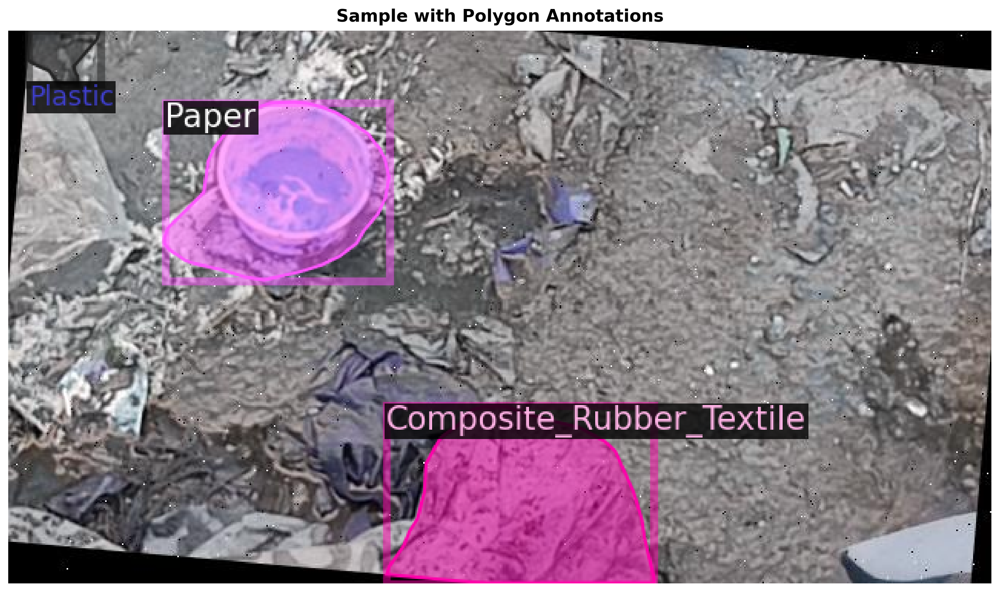

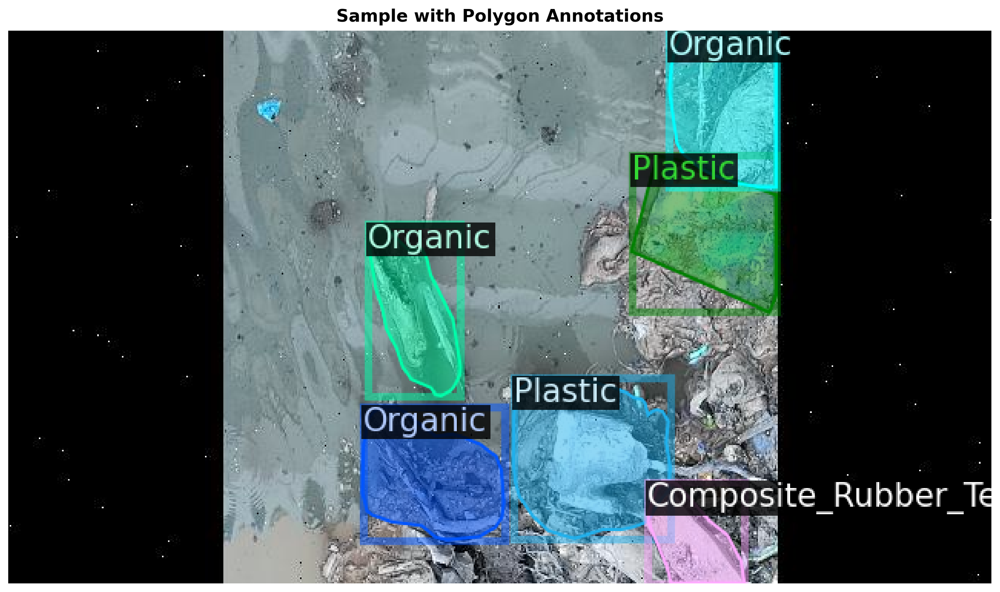

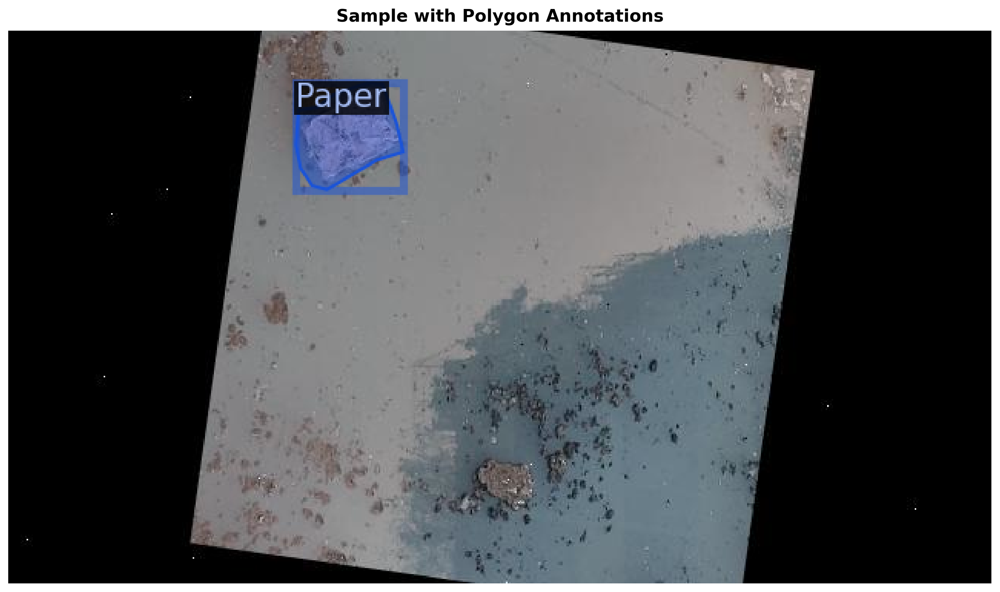


Configuration saved to ./waste_maskrcnn_polygon_output_20260314_085450/config.yaml

Starting Mask R-CNN training with polygon segmentation...
[03/14 08:54:51 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size

model_final_f10217.pkl: 178MB [00:00, 206MB/s]                             
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (5, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (5,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (16, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (16,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due t

[03/14 08:54:52 d2.engine.train_loop]: Starting training from iteration 0


torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /pytorch/aten/src/ATen/native/TensorShape.cpp:4317.)
W0314 08:54:55.176000 55 torch/fx/_symbolic_trace.py:52] is_fx_tracing will return true for both fx.symbolic_trace and torch.export. Please use is_fx_tracing_symbolic_tracing() for specifically fx.symbolic_trace or torch.compiler.is_compiling() for specifically torch.export/compile.


[03/14 08:55:05 d2.utils.events]:  eta: 0:42:06  iter: 19  total_loss: 3.004  loss_cls: 1.722  loss_box_reg: 0.4325  loss_mask: 0.6945  loss_rpn_cls: 0.05902  loss_rpn_loc: 0.01134    time: 0.4913  last_time: 0.5269  data_time: 0.0129  last_data_time: 0.0054   lr: 9.9905e-06  max_mem: 2580M


2026-03-14 08:55:07.653591: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1773478507.830785      55 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1773478507.880615      55 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1773478508.278440      55 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1773478508.278476      55 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1773478508.278480      55 computation_placer.cc:177] computation placer alr

[03/14 08:55:33 d2.utils.events]:  eta: 0:41:56  iter: 39  total_loss: 2.746  loss_cls: 1.472  loss_box_reg: 0.4585  loss_mask: 0.6889  loss_rpn_cls: 0.04246  loss_rpn_loc: 0.01205    time: 0.4915  last_time: 0.4692  data_time: 0.0066  last_data_time: 0.0056   lr: 1.998e-05  max_mem: 2580M
[03/14 08:55:43 d2.utils.events]:  eta: 0:41:24  iter: 59  total_loss: 2.168  loss_cls: 0.9548  loss_box_reg: 0.48  loss_mask: 0.6807  loss_rpn_cls: 0.02988  loss_rpn_loc: 0.009942    time: 0.4863  last_time: 0.4570  data_time: 0.0057  last_data_time: 0.0059   lr: 2.997e-05  max_mem: 2580M
[03/14 08:55:53 d2.utils.events]:  eta: 0:41:07  iter: 79  total_loss: 1.813  loss_cls: 0.6086  loss_box_reg: 0.4341  loss_mask: 0.6658  loss_rpn_cls: 0.04889  loss_rpn_loc: 0.01404    time: 0.4911  last_time: 0.5393  data_time: 0.0067  last_data_time: 0.0131   lr: 3.9961e-05  max_mem: 2615M
[03/14 08:56:03 d2.utils.events]:  eta: 0:41:30  iter: 99  total_loss: 1.663  loss_cls: 0.5059  loss_box_reg: 0.457  loss_mas

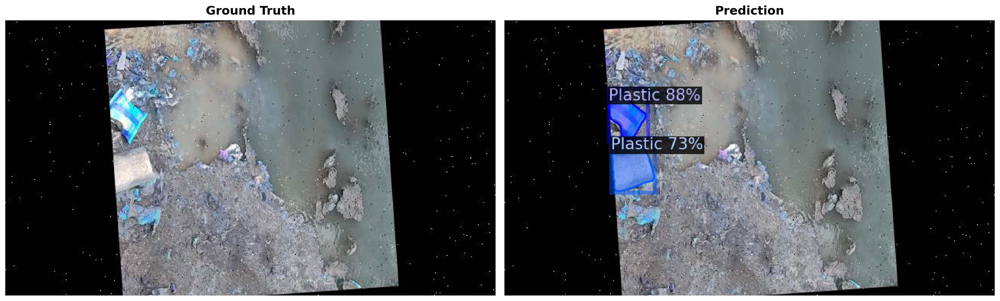

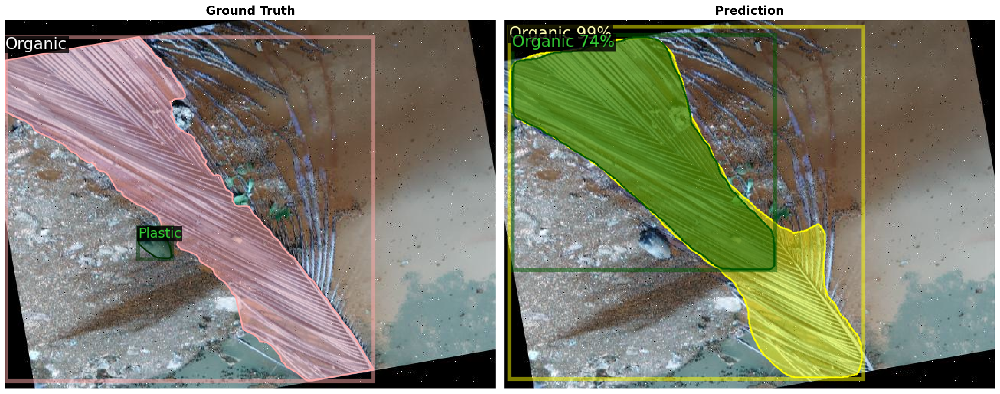

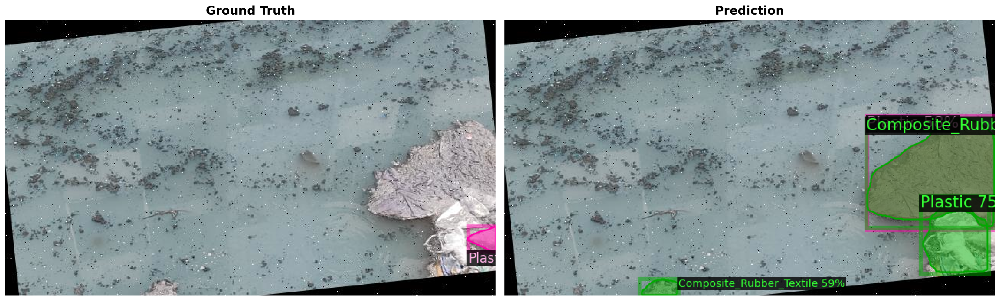


Training process completed. Model saved at ./waste_maskrcnn_polygon_output_20260314_085450


In [16]:
# Complete Mask R-CNN Training Code for Waste Detection with Polygon Segmentation
# For use with balanced datasets in COCO format

# # Install required packages
# !pip install -q torch torchvision
# !pip install -q 'git+https://github.com/facebookresearch/detectron2.git'

import os
import json
import torch
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime

import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

from detectron2 import model_zoo
from detectron2.engine import DefaultTrainer, DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.data import MetadataCatalog, DatasetCatalog, build_detection_test_loader
from detectron2.data.datasets import register_coco_instances
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

# Define paths to your balanced dataset
BALANCED_ROOT = "/kaggle/working/WasteClassification-Balanced-Segmentation"
TRAIN_JSON = os.path.join(BALANCED_ROOT, "train", "_annotations.coco.json")
VAL_JSON = os.path.join(BALANCED_ROOT, "valid", "_annotations.coco.json")
TEST_JSON = os.path.join(BALANCED_ROOT, "test", "_annotations.coco.json")
TRAIN_DIR = os.path.join(BALANCED_ROOT, "train")
VAL_DIR = os.path.join(BALANCED_ROOT, "valid")
TEST_DIR = os.path.join(BALANCED_ROOT, "test")

def _ensure_coco_header(data: dict):
    # pycocotools expects coco.dataset['info'] to exist during loadRes()
    if "info" not in data or not isinstance(data.get("info"), dict):
        data["info"] = {"description": "Generated by notebook", "version": "1.0"}
    if "licenses" not in data or not isinstance(data.get("licenses"), list):
        data["licenses"] = []
    return data

# Function to check and add polygon segmentation if missing
def ensure_polygon_segmentation(coco_file, output_file=None, keep_classes=None):
    """Verify and add segmentation data if missing. Optionally filter to keep_classes only."""
    with open(coco_file, 'r') as f:
        data = json.load(f)

    data = _ensure_coco_header(data)

    print(f"\nChecking {coco_file}:")
    print(f"- Images: {len(data['images'])}")
    print(f"- Annotations: {len(data['annotations'])}")

    # Remove categories not in keep_classes (if specified)
    if keep_classes is not None:
        keep_set = set(keep_classes)
        remove_cat_ids = {c['id'] for c in data['categories'] if c['name'] not in keep_set}
        if remove_cat_ids:
            removed_names = [c['name'] for c in data['categories'] if c['id'] in remove_cat_ids]
            data['categories'] = [c for c in data['categories'] if c['id'] not in remove_cat_ids]
            orig_ann_count = len(data['annotations'])
            data['annotations'] = [a for a in data['annotations'] if a['category_id'] not in remove_cat_ids]
            print(f"- Removed categories {removed_names} and {orig_ann_count - len(data['annotations'])} annotations")

    # Check if segmentation data exists
    missing_segmentation = 0
    for anno in data['annotations']:
        if "segmentation" not in anno or not anno["segmentation"]:
            missing_segmentation += 1
            x, y, w, h = anno["bbox"]
            polygon = [[x, y, x+w, y, x+w, y+h, x, y+h]]
            anno["segmentation"] = polygon

    print(f"- Added segmentation to {missing_segmentation} annotations")

    # Save modified file
    output_file = output_file or coco_file.replace(".coco.json", "_with_seg.coco.json")
    with open(output_file, 'w') as f:
        json.dump(data, f)
    print(f"- Saved to {output_file}")

    return output_file

# Define class names before use
waste_classes = ["Composite_Rubber_Textile", "Organic", "Paper", "Plastic"]

# Process all dataset splits — also strip any categories not in waste_classes
modified_train_json = ensure_polygon_segmentation(TRAIN_JSON, keep_classes=waste_classes)
modified_val_json = ensure_polygon_segmentation(VAL_JSON, keep_classes=waste_classes)
modified_test_json = ensure_polygon_segmentation(TEST_JSON, keep_classes=waste_classes)

# Unregister any existing datasets with the same names (to avoid conflicts)
for d in ["waste_train_seg", "waste_val_seg", "waste_test_seg"]:
    if d in DatasetCatalog.list():
        DatasetCatalog.remove(d)
        MetadataCatalog.remove(d)

# Register the datasets with Detectron2 using unique names
register_coco_instances("waste_train_seg", {}, modified_train_json, TRAIN_DIR)
register_coco_instances("waste_val_seg", {}, modified_val_json, VAL_DIR)
register_coco_instances("waste_test_seg", {}, modified_test_json, TEST_DIR)
for dataset in ["waste_train_seg", "waste_val_seg", "waste_test_seg"]:
    MetadataCatalog.get(dataset).set(thing_classes=waste_classes)

# Visualize examples to verify data
waste_metadata = MetadataCatalog.get("waste_train_seg")
dataset_dicts = DatasetCatalog.get("waste_train_seg")

print("\nVisualizing sample training examples...")
for d in random.sample(dataset_dicts, min(3, len(dataset_dicts))):
    img = cv2.imread(d["file_name"])
    if img is None:
        print(f"Warning: Could not read image {d['file_name']}")
        continue
    visualizer = Visualizer(img[:, :, ::-1], metadata=waste_metadata, scale=1.0)
    vis = visualizer.draw_dataset_dict(d)
    fig, ax = plt.subplots(figsize=(18, 14))
    ax.imshow(vis.get_image()[:, :, ::-1])
    ax.axis("off")
    ax.set_title("Sample with Polygon Annotations", fontsize=22, fontweight='bold', pad=12)
    plt.tight_layout()
    plt.show()

# Define custom trainer with evaluation
class COCOTrainer(DefaultTrainer):
    @classmethod
    def build_evaluator(cls, cfg, dataset_name, output_folder=None):
        if output_folder is None:
            output_folder = os.path.join(cfg.OUTPUT_DIR, "inference")
        return COCOEvaluator(dataset_name, cfg, False, output_folder)

# Configure the Mask R-CNN model for polygon segmentation
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
OUTPUT_DIR = f"./waste_maskrcnn_polygon_output_{timestamp}"
os.makedirs(OUTPUT_DIR, exist_ok=True)

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("waste_train_seg",)
cfg.DATASETS.TEST = ("waste_val_seg",)
cfg.DATALOADER.NUM_WORKERS = 2
cfg.DATALOADER.SAMPLER_TRAIN = "RepeatFactorTrainingSampler"
cfg.DATALOADER.REPEAT_THRESHOLD = 0.001
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.0005
cfg.SOLVER.MAX_ITER = 5000
cfg.SOLVER.STEPS = [3000, 4000]
cfg.SOLVER.CHECKPOINT_PERIOD = 500  # ensures checkpoints exist even if training stops early
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
cfg.MODEL.MASK_ON = True
cfg.TEST.EVAL_PERIOD = 500
cfg.OUTPUT_DIR = OUTPUT_DIR

with open(os.path.join(OUTPUT_DIR, "config.yaml"), "w") as f:
    f.write(cfg.dump())
print(f"\nConfiguration saved to {os.path.join(OUTPUT_DIR, 'config.yaml')}")

try:
    print("\nStarting Mask R-CNN training with polygon segmentation...")
    trainer = COCOTrainer(cfg)
    trainer.resume_or_load(resume=False)
    trainer.train()
    print("Training completed successfully!")

    ckpts = [p for p in os.listdir(OUTPUT_DIR) if p.endswith('.pth') or p.endswith('.pkl')]
    print("\nCheckpoint files:")
    if not ckpts:
        print("  (none found) — training likely stopped before the first checkpoint period")
    else:
        for p in sorted(ckpts):
            print("  -", p)

    print("\nCreating predictor for inference...")
    cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
    predictor = DefaultPredictor(cfg)

    print("\nEvaluating model on test dataset...")
    evaluator = COCOEvaluator("waste_test_seg", cfg, False, output_dir=OUTPUT_DIR)
    test_loader = build_detection_test_loader(cfg, "waste_test_seg")
    eval_results = inference_on_dataset(predictor.model, test_loader, evaluator)

    print("\nTest Set Evaluation Results:")
    if "bbox" in eval_results:
        print(f"Bbox AP: {eval_results['bbox']['AP']:.4f}")
    if "segm" in eval_results:
        print(f"Segmentation AP: {eval_results['segm']['AP']:.4f}")

    test_dataset_dicts = DatasetCatalog.get("waste_test_seg")
    print("\nVisualizing test examples with predictions...")
    for d in random.sample(test_dataset_dicts, min(3, len(test_dataset_dicts))):
        im = cv2.imread(d["file_name"])
        if im is None:
            print(f"Warning: Could not read image {d['file_name']}")
            continue
        outputs = predictor(im)
        fig, axes = plt.subplots(1, 2, figsize=(28, 14))
        v1 = Visualizer(im[:, :, ::-1], metadata=MetadataCatalog.get("waste_test_seg"), scale=1.0)
        gt = v1.draw_dataset_dict(d)
        axes[0].imshow(gt.get_image()[:, :, ::-1])
        axes[0].set_title("Ground Truth", fontsize=24, fontweight='bold', pad=12)
        axes[0].axis("off")
        v2 = Visualizer(im[:, :, ::-1], metadata=MetadataCatalog.get("waste_test_seg"), instance_mode=ColorMode.SEGMENTATION, scale=1.0)
        pred = v2.draw_instance_predictions(outputs["instances"].to("cpu"))
        axes[1].imshow(pred.get_image()[:, :, ::-1])
        axes[1].set_title("Prediction", fontsize=24, fontweight='bold', pad=12)
        axes[1].axis("off")
        plt.tight_layout()
        plt.show()

    print(f"\nTraining process completed. Model saved at {OUTPUT_DIR}")

except Exception as e:
    print(f"\n❌ ERROR during training: {e}")
    print("\nDiagnostic information:")
    print("Checking dataset annotations for segmentation fields...")
    for name in ["waste_train_seg", "waste_val_seg", "waste_test_seg"]:
        try:
            sample_data = DatasetCatalog.get(name)[0]
            print(f"\nDataset '{name}' sample annotation structure:")
            for k, v in sample_data.items():
                print(f"- {k}: {type(v)}")
            if "annotations" in sample_data and len(sample_data["annotations"]) > 0:
                sample_anno = sample_data["annotations"][0]
                print(f"  First annotation fields: {list(sample_anno.keys())}")
                if "segmentation" in sample_anno:
                    print(f"  Segmentation format: {type(sample_anno['segmentation'])}")
        except Exception as err:
            print(f"  Error accessing {name}: {err}")

In [17]:
# %% Cell: Load your trained Mask R-CNN weights
from detectron2.config import get_cfg
from detectron2.engine import DefaultPredictor
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.data.datasets import register_coco_instances
from detectron2 import model_zoo
import os
import cv2
import torch
import glob

# Optional overrides (recommended if auto-detection fails)
CUSTOM_OUTPUT_DIR = None      # e.g. r"C:\path\to\output_dir" or "/kaggle/working/waste_maskrcnn_polygon_output_..."
CUSTOM_WEIGHTS_PATH = None   # e.g. r"C:\path\to\model_final.pth" or "/kaggle/working/.../model_final.pth"
CUSTOM_BALANCED_ROOT = None  # e.g. r"C:\path\to\WasteClassification-Balanced-Segmentation"

def _pick_ann_json(split_dir: str) -> str:
    """Prefer *_with_seg if present; fall back to the original COCO json."""
    with_seg = os.path.join(split_dir, "_annotations_with_seg.coco.json")
    base = os.path.join(split_dir, "_annotations.coco.json")
    return with_seg if os.path.exists(with_seg) else base

# Define paths
BALANCED_ROOT = CUSTOM_BALANCED_ROOT or "/kaggle/working/WasteClassification-Balanced-Segmentation"
TRAIN_DIR = os.path.join(BALANCED_ROOT, "train")
VAL_DIR = os.path.join(BALANCED_ROOT, "valid")
TEST_DIR = os.path.join(BALANCED_ROOT, "test")

# Choose output directory
if CUSTOM_OUTPUT_DIR:
    output_dir = CUSTOM_OUTPUT_DIR
    os.makedirs(output_dir, exist_ok=True)
else:
    # Find the most recent output directory (Kaggle/Colab or local)
    candidates = []
    candidates += glob.glob(os.path.join(os.getcwd(), "waste_maskrcnn_polygon_output_*"))
    candidates += glob.glob("/kaggle/working/waste_maskrcnn_polygon_output_*")
    output_dirs = [p for p in dict.fromkeys(candidates) if os.path.isdir(p)]
    if not output_dirs:
        print("\n⚠️ WARNING: No training output directory found. Using pretrained COCO weights.")
        output_dir = "/kaggle/working/waste_maskrcnn_polygon_output_fallback"
        os.makedirs(output_dir, exist_ok=True)
    else:
        output_dir = max(output_dirs, key=os.path.getmtime)
print(f"Using output directory: {output_dir}")

# List all files in output directory for debugging
print(f"\nFiles in output directory:")
all_files = os.listdir(output_dir)
if not all_files:
    print("  (empty directory)")
else:
    for f in all_files:
        file_path = os.path.join(output_dir, f)
        size = os.path.getsize(file_path) if os.path.isfile(file_path) else 0
        print(f"  - {f} ({size / 1024 / 1024:.2f} MB)" if size > 0 else f"  - {f}/")

# Find the best available weights file with graceful fallback
weights_path = None
use_pretrained = False

if CUSTOM_WEIGHTS_PATH and os.path.exists(CUSTOM_WEIGHTS_PATH):
    weights_path = CUSTOM_WEIGHTS_PATH
    print("\nFound CUSTOM_WEIGHTS_PATH")
else:
    final_path = os.path.join(output_dir, "model_final.pth")
    if os.path.exists(final_path):
        weights_path = final_path
        print("\nFound model_final.pth")
    else:
        print("\nmodel_final.pth not found, checking for checkpoints...")
        last_checkpoint_file = os.path.join(output_dir, "last_checkpoint")
        if os.path.exists(last_checkpoint_file):
            try:
                with open(last_checkpoint_file, 'r') as f:
                    checkpoint_name = f.read().strip()
                potential_path = os.path.join(output_dir, checkpoint_name)
                if os.path.exists(potential_path):
                    weights_path = potential_path
                    print(f"Found checkpoint from last_checkpoint file: {checkpoint_name}")
            except Exception as e:
                print(f"  Error reading last_checkpoint: {e}")
        if weights_path is None:
            pth_files = glob.glob(os.path.join(output_dir, "*.pth"))
            if pth_files:
                weights_path = max(pth_files, key=os.path.getmtime)
                print(f"Found checkpoint: {os.path.basename(weights_path)}")

if weights_path is None or not os.path.exists(weights_path):
    print("\n⚠️ WARNING: No trained model weights found!")
    print("This usually happens when training stops before the first checkpoint is saved.")
    print("Fix: in the training cell, set cfg.SOLVER.CHECKPOINT_PERIOD smaller (e.g., 200 or 500) and train again.")
    print("\nUsing PRETRAINED COCO weights as fallback for demonstration...")
    print("Note: Results will NOT reflect your trained model!\n")
    use_pretrained = True
    weights_path = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")

print(f"Using weights: {weights_path}")

# Register datasets if not already registered
waste_classes = ["Composite_Rubber_Textile", "Organic", "Paper", "Plastic"]

for name, split_dir in [
    ("waste_train_seg", TRAIN_DIR),
    ("waste_val_seg", VAL_DIR),
    ("waste_test_seg", TEST_DIR),
]:
    json_file = _pick_ann_json(split_dir)
    if name not in DatasetCatalog.list():
        register_coco_instances(name, {}, json_file, split_dir)
        MetadataCatalog.get(name).set(thing_classes=waste_classes)

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("waste_train_seg",)
cfg.DATASETS.TEST = ("waste_test_seg",)
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = weights_path
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 80 if use_pretrained else 4
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
cfg.MODEL.MASK_ON = True
cfg.OUTPUT_DIR = output_dir

predictor = DefaultPredictor(cfg)
print("Loaded weights from:", cfg.MODEL.WEIGHTS)

if use_pretrained:
    print("\n⚠️ REMINDER: Using pretrained COCO weights, not your trained waste classification model!")
    print("We will count detections, but we will NOT map COCO classes to your 4 classes.\n")

gt_labels = []
pred_labels = []
pred_instances_total = 0
pred_instances_kept = 0

threshold = 0.5
test_dicts = DatasetCatalog.get("waste_test_seg")

print(f"Processing {len(test_dicts)} test images...")
for d in test_dicts:
    im = cv2.imread(d["file_name"])
    if im is None:
        print(f"Warning: Could not read {d['file_name']}")
        continue
    outputs = predictor(im)
    instances = outputs["instances"].to("cpu")

    scores = instances.scores.numpy() if instances.has("scores") else []
    classes = instances.pred_classes.numpy() if instances.has("pred_classes") else []

    pred_instances_total += len(scores) if hasattr(scores, '__len__') else 0
    kept = (scores >= threshold) if hasattr(scores, '__len__') else []
    pred_instances_kept += int(kept.sum()) if hasattr(kept, 'sum') else 0

    if not use_pretrained:
        pred = classes[kept]
        pred_labels.extend(pred.tolist())

    anns = d.get("annotations", [])
    gt = [ann["category_id"] for ann in anns]
    gt_labels.extend(gt)

print(f"Collected {len(gt_labels)} ground-truth labels")
print(f"Detections: total={pred_instances_total}, kept(score>={threshold})={pred_instances_kept}")
print(f"Collected {len(pred_labels)} prediction labels (only for 4-class trained model)")

Using output directory: /kaggle/working/waste_maskrcnn_polygon_output_20260314_085450

Files in output directory:
  - model_final.pth (334.88 MB)
  - model_0002999.pth (334.88 MB)
  - model_0000999.pth (334.88 MB)
  - events.out.tfevents.1773478523.cada428aa4d0.55.0 (0.28 MB)
  - model_0000499.pth (334.88 MB)
  - last_checkpoint (0.00 MB)
  - metrics.json (0.19 MB)
  - inference/
  - instances_predictions.pth (0.21 MB)
  - config.yaml (0.01 MB)
  - model_0004999.pth (334.88 MB)
  - model_0003499.pth (334.88 MB)
  - model_0003999.pth (334.88 MB)
  - model_0001999.pth (334.88 MB)
  - model_0001499.pth (334.88 MB)
  - model_0004499.pth (334.88 MB)
  - coco_instances_results.json (0.27 MB)
  - model_0002499.pth (334.88 MB)

Found model_final.pth
Using weights: /kaggle/working/waste_maskrcnn_polygon_output_20260314_085450/model_final.pth
[03/14 09:51:34 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /kaggle/working/waste_maskrcnn_polygon_output_20260314_085450/mod

In [18]:
# %% Cell: COCO‐style mAP Evaluation
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader, MetadataCatalog

DATASET_NAME = "waste_test_seg"

def _infer_dataset_num_classes(dataset_name: str):
    meta = MetadataCatalog.get(dataset_name)
    thing_classes = getattr(meta, "thing_classes", None)
    if thing_classes is not None and len(thing_classes) > 0:
        return len(thing_classes)
    return None

def _infer_model_num_classes(model):
    # Detectron2 Fast R-CNN head predicts (num_classes + 1) logits including background
    try:
        return int(model.roi_heads.box_predictor.cls_score.out_features - 1)
    except Exception:
        return None

dataset_num_classes = _infer_dataset_num_classes(DATASET_NAME)
model_num_classes = _infer_model_num_classes(predictor.model) if "predictor" in globals() else None

class_mismatch = (
    dataset_num_classes is not None
    and model_num_classes is not None
    and model_num_classes != dataset_num_classes
 )

print(f"Model classes: {model_num_classes} | Dataset classes: {dataset_num_classes}")

if dataset_num_classes is None:
    print(f"⚠️ Could not infer class count from MetadataCatalog for '{DATASET_NAME}'.")
    print("   Make sure the dataset is registered and has thing_classes set.")
    eval_results = None
elif model_num_classes is None:
    print("⚠️ Could not infer class count from the model head.")
    print("   Make sure predictor/model is created and is a Detectron2 Mask R-CNN model.")
    eval_results = None
elif class_mismatch:
    print("⚠️ Skipping COCOEvaluator due to class-count mismatch:")
    print(f"   model predicts {model_num_classes} classes, but dataset '{DATASET_NAME}' has {dataset_num_classes} classes.")
    print("   Fix: load a 4-class fine-tuned weight file (not COCO-80 pretrained) and rebuild the predictor.")
    print("   Expected setup:")
    print("     cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4")
    print("     cfg.MODEL.WEIGHTS = '/path/to/model_final.pth'")
    eval_results = None
else:
    evaluator = COCOEvaluator(DATASET_NAME, cfg, False, output_dir=output_dir)
    test_loader = build_detection_test_loader(cfg, DATASET_NAME)
    eval_results = inference_on_dataset(predictor.model, test_loader, evaluator)

    print(">>> COCO Evaluation Results:")
    print(f"  BBox AP: {eval_results['bbox']['AP']:.4f}")
    print(f"  Segm  AP: {eval_results['segm']['AP']:.4f}\n")

    # Note: Detectron2's COCOEvaluator returns overall metrics in eval_results.
    # Per-class AP is printed by the evaluator itself (stdout) but not exposed as AP-0/AP-1 keys here.

Model classes: 4 | Dataset classes: 4
WARNING [03/14 09:52:03 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[03/14 09:52:03 d2.data.datasets.coco]: Loaded 195 images in COCO format from /kaggle/working/WasteClassification-Balanced-Segmentation/test/_annotations_with_seg.coco.json
[03/14 09:52:03 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[03/14 09:52:03 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[03/14 09:52:03 d2.data.common]: Serializing 195 elements to byte tensors and concatenating them all ...
[03/14 09:52:03 d2.data.common]: Serialized dataset takes 0.27 MiB
[03/14 09:52:03 d2.evaluation.evaluator]: Start inference on 195 batches
[03/14 09:52:04 d2.evaluation.evaluator]: Inference done 11/195. Dataloading:

In [19]:
# %% Cell: Match GT ↔ Pred by IoU and build aligned lists
import torch
import cv2
from detectron2.data import DatasetCatalog
from detectron2.structures import Instances, Boxes
from detectron2.structures import pairwise_iou

if 'use_pretrained' in globals() and use_pretrained:
    print("⚠️ Skipping GT↔Pred matching: pretrained COCO class IDs don't match your 4 waste classes.")
    matched_true = []
    matched_pred = []
    true_names = []
    pred_names = []
else:
    matched_true = []
    matched_pred = []

    for d in DatasetCatalog.get("waste_test_seg"):
        im = cv2.imread(d["file_name"])
        if im is None:
            continue
        outputs = predictor(im)["instances"].to("cpu")
        pred = outputs
        gt_anns = d.get("annotations", [])
        if len(gt_anns) == 0 or len(pred) == 0:
            continue

        # Convert GT bboxes (xywh) → xyxy tensor
        gt_boxes = torch.tensor([[x, y, x+w, y+h] for x, y, w, h in (ann["bbox"] for ann in gt_anns)])
        gt_classes = torch.tensor([ann["category_id"] for ann in gt_anns])
        gt_inst = Instances(im.shape[:2])
        gt_inst.gt_boxes = Boxes(gt_boxes)
        gt_inst.gt_classes = gt_classes

        # Compute IoU between every pred box and every GT box
        ious = pairwise_iou(pred.pred_boxes, gt_inst.gt_boxes)
        for gt_idx in range(len(gt_inst)):
            # find the pred with highest IoU for this GT
            pred_idx = torch.argmax(ious[:, gt_idx]).item()
            if ious[pred_idx, gt_idx] >= 0.5:
                t = gt_inst.gt_classes[gt_idx].item()
                p = pred.pred_classes[pred_idx].item()
                # Safety: keep only valid class ids
                if 0 <= t < len(waste_classes) and 0 <= p < len(waste_classes):
                    matched_true.append(t)
                    matched_pred.append(p)

    # Map numeric IDs → class names
    true_names = [waste_classes[i] for i in matched_true]
    pred_names = [waste_classes[i] for i in matched_pred]


[03/14 09:52:29 d2.data.datasets.coco]: Loaded 195 images in COCO format from /kaggle/working/WasteClassification-Balanced-Segmentation/test/_annotations_with_seg.coco.json


In [20]:
# %% Cell: Classification Report
from sklearn.metrics import classification_report

if 'class_mismatch' in globals() and class_mismatch:
    print("⚠️ Skipping classification_report: model classes don't match your 4 waste classes.")
elif len(true_names) == 0:
    print("No matched pairs found (try lowering IoU threshold or check predictions).")
else:
    print(classification_report(
        true_names,
        pred_names,
        target_names=waste_classes,
        zero_division=0
    ))

                          precision    recall  f1-score   support

Composite_Rubber_Textile       1.00      0.89      0.94        36
                 Organic       0.96      0.98      0.97        55
                   Paper       0.81      0.72      0.76        53
                 Plastic       0.88      0.93      0.91       151

                accuracy                           0.90       295
               macro avg       0.91      0.88      0.90       295
            weighted avg       0.90      0.90      0.90       295



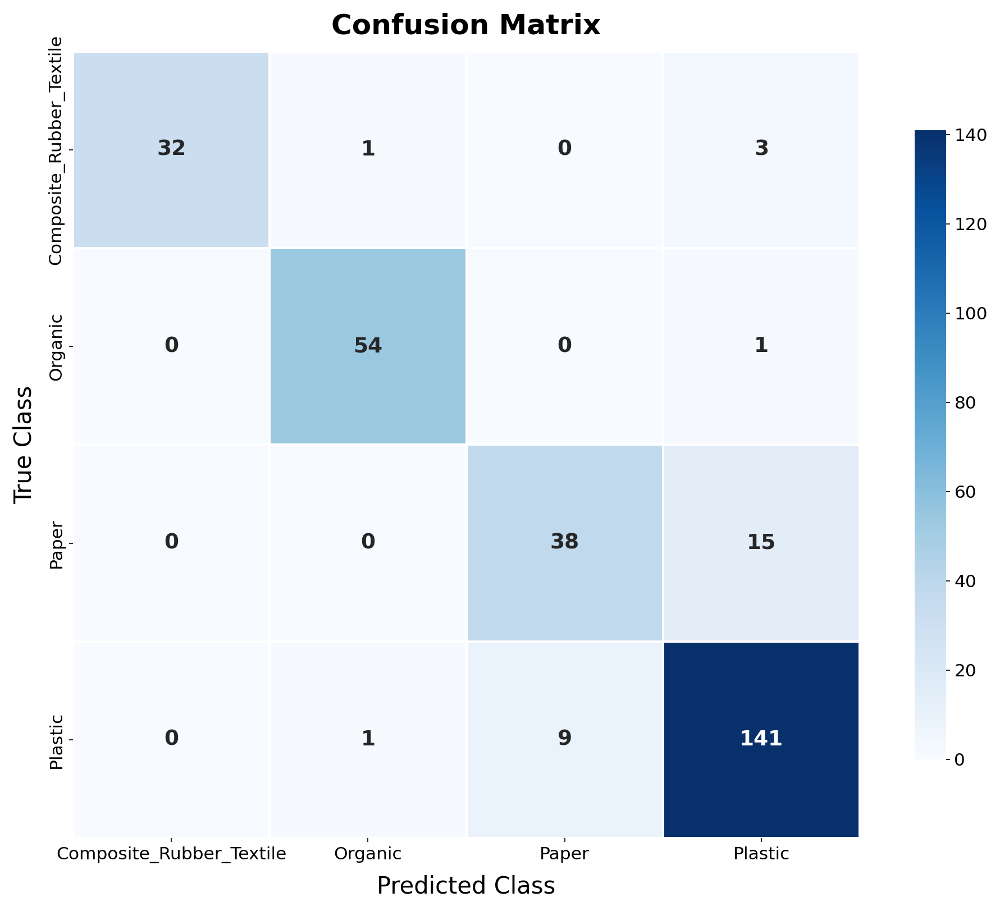

In [21]:
# %% Cell: Confusion Matrix Heatmap
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

if 'class_mismatch' in globals() and class_mismatch:
    print("⚠️ Skipping confusion matrix: model classes don't match your 4 waste classes.")
elif len(true_names) == 0:
    print("No matched pairs found; confusion matrix not available.")
else:
    cm = confusion_matrix(true_names, pred_names, labels=waste_classes)
    fig, ax = plt.subplots(figsize=(14, 11))
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        cmap="Blues",
        xticklabels=waste_classes,
        yticklabels=waste_classes,
        linewidths=1,
        linecolor='white',
        square=True,
        annot_kws={"size": 18, "fontweight": "bold"},
        cbar_kws={"shrink": 0.8},
        ax=ax,

    )
    ax.set_xlabel("Predicted Class", fontsize=20, labelpad=10)
    ax.set_ylabel("True Class", fontsize=20, labelpad=10)
    ax.set_title("Confusion Matrix", fontsize=24, fontweight='bold', pad=15)
    ax.tick_params(axis='both', labelsize=15)
    plt.tight_layout()
    plt.show()

In [22]:
# %% Cell: Compute Accuracy
from sklearn.metrics import accuracy_score

if 'class_mismatch' in globals() and class_mismatch:
    print("⚠️ Skipping accuracy: model classes don't match your 4 waste classes.")
elif len(true_names) == 0:
    print("No matched pairs found; accuracy not available.")
else:
    # accuracy over your IoU‐matched pairs
    accuracy = accuracy_score(true_names, pred_names)
    print(f"Accuracy: {accuracy:.4f}")

Accuracy: 0.8983


In [23]:
# %% Cell: Print COCO mAP
# Overall COCO mAP is the AP reported by the evaluator

if 'class_mismatch' in globals() and class_mismatch:
    print("⚠️ COCO mAP not available: model classes don't match the dataset classes.")
elif eval_results is None:
    print("COCO mAP not available (eval_results is None).")
else:
    bbox_map = eval_results["bbox"]["AP"]
    segm_map = eval_results["segm"]["AP"]

    print(f"Bounding‐Box mAP (AP@[.50:.95]): {bbox_map:.4f}")
    print(f"Segmentation  mAP (AP@[.50:.95]): {segm_map:.4f}")

Bounding‐Box mAP (AP@[.50:.95]): 29.1117
Segmentation  mAP (AP@[.50:.95]): 24.6526
